# 1. Environtmental Set Up

# Undersea Mamals Classification

Code originally created by,

1. 5054251001 - Benedictus Ryu Gunawan
2. 5054251008 - Hilal Tsabitul Azmi  
3. 5054251019 - Rasya Arya Ramadhan

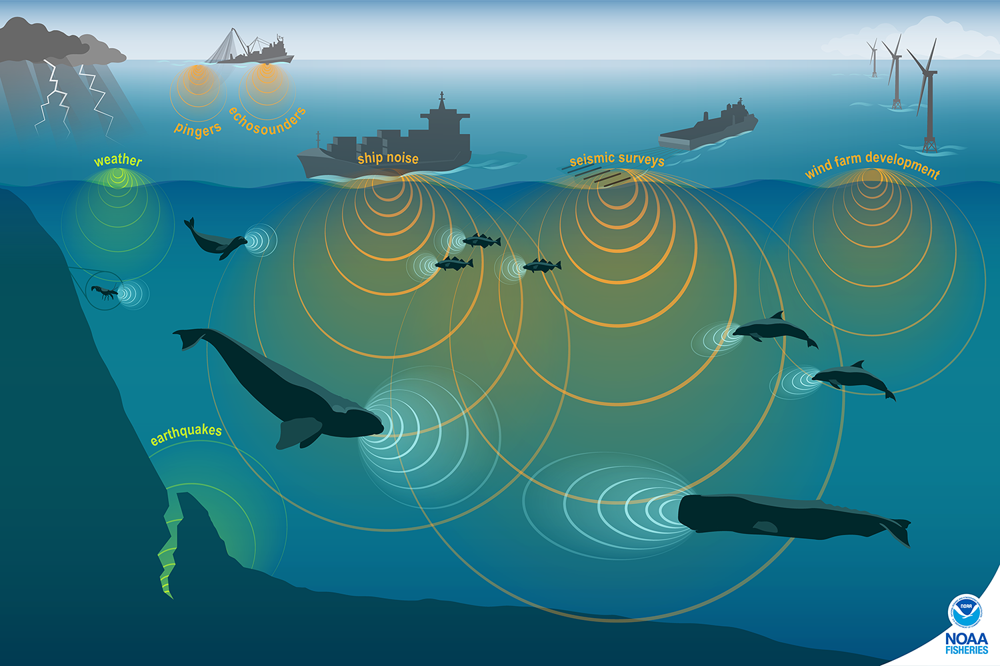

Dataset originally from Final stage of Intellecta Cup Telkom University
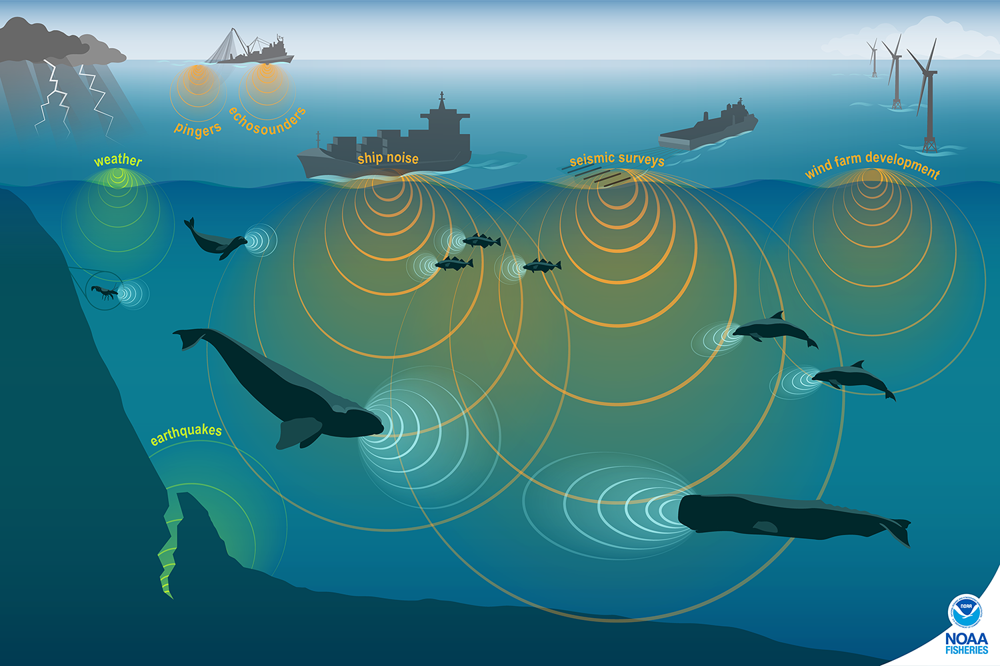
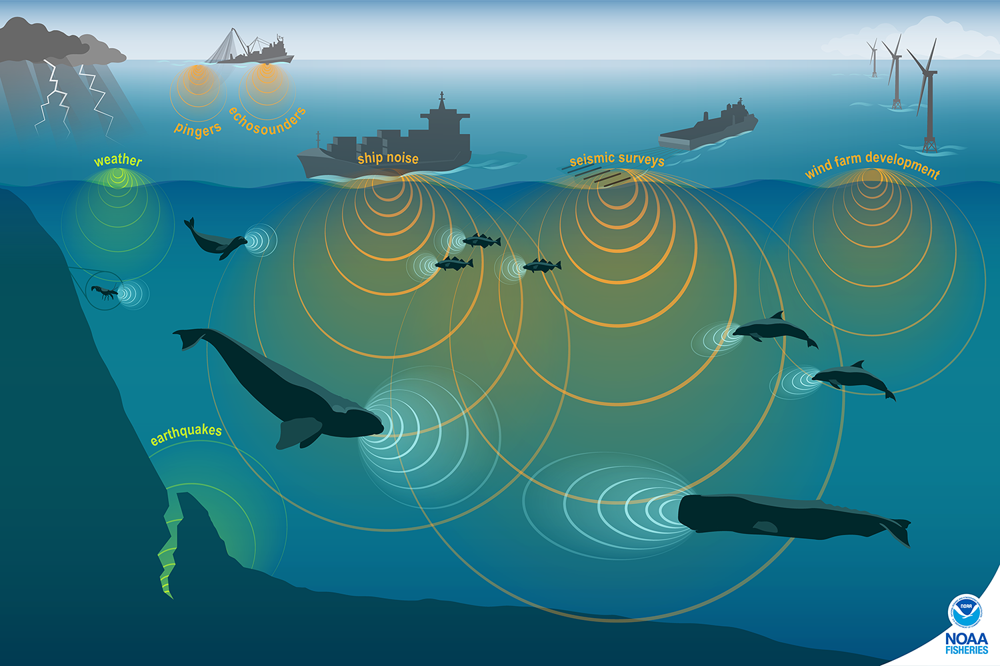
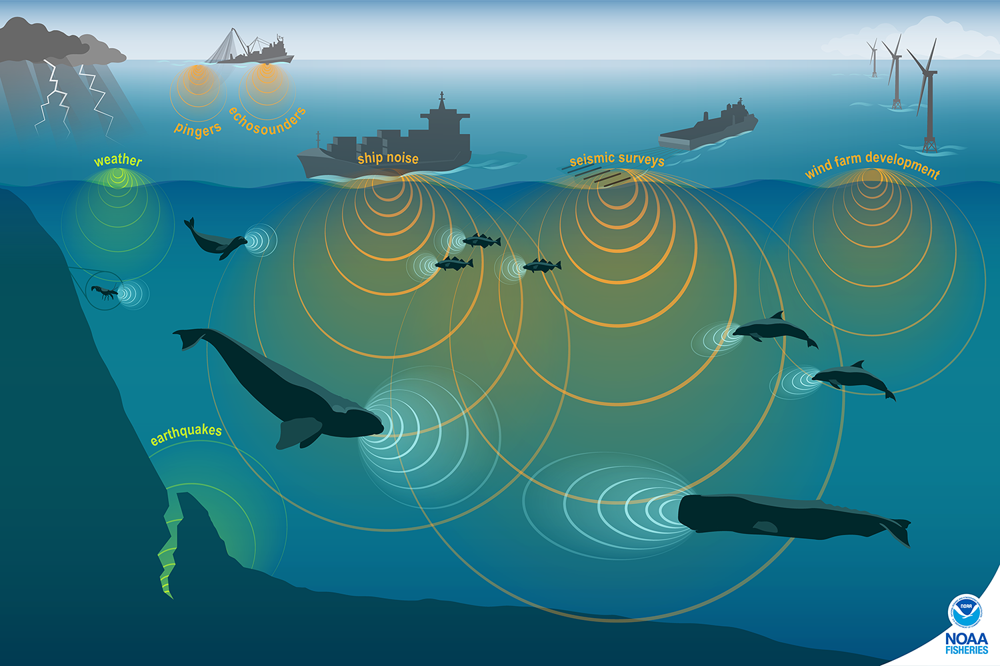

## 1.1 Library Importing

In [24]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import os
import warnings
import seaborn as sns

import librosa, librosa.display 
import regex as r

from scipy.stats import kurtosis
from scipy.fft import rfft, rfftfreq

from pathlib import Path
from tqdm import tqdm

## 1.2 Constant

In [25]:
SEED = 2025
TARGET_SR = 22050
TARGET = "species"
TRAIN_AUDIO_PATH = "/kaggle/input/intellecta-final-dataset/Intellecta-Final/decoded_audio/train"
TEST_AUDIO_PATH = "/kaggle/input/intellecta-final-dataset/Intellecta-Final/decoded_audio/test"
TRAIN_CSV_PATH = "/kaggle/input/intellecta-final-dataset/Intellecta-Final/train.csv"
TEST_CSV_PATH = "/kaggle/input/intellecta-final-dataset/Intellecta-Final/test.csv"

## 1.3 Utils

In [26]:
def get_unique_extensions(root_dir):
    extensions = set()
    for root, dirs, files in os.walk(root_dir):
        for file in files:
            _, ext = os.path.splitext(file)
            if ext: 
                extensions.add(ext.lower())        
    return sorted(list(extensions))

In [27]:
def get_audio(df, PATH):
    y_list = []
    length_list = []
    sr_list = []
    for file in tqdm(df["audio"]): 
        file_path = os.path.join(PATH, file)
        y, sr = librosa.load(file_path, sr=TARGET_SR, mono=True)
        
        y_list.append(y)
        length_list.append(len(y))
        sr_list.append(sr)
    
    df['y'] = y_list
    df['length'] = length_list
    df['sr'] = sr_list
    
    return df

In [28]:
def sample_and_flatten_audio(
    df: pd.DataFrame, 
    array_col: str, 
    label_col: str, 
    n_samples: int = 1000, 
    random_state: int = SEED
) -> pd.DataFrame:
    """
    Mengambil sampel dari kolom array (audio) dan meratakannya (flatten)
    menjadi format long-form yang siap untuk plotting Seaborn.
    
    Parameters:
    -----------
    df : pd.DataFrame
        DataFrame sumber.
    array_col : str
        Nama kolom yang berisi list/array (contoh: 'y').
    label_col : str
        Nama kolom kategori/spesies (contoh: 'species').
    n_samples : int
        Jumlah titik maksimum yang diambil per baris/file audio.
    random_state : int
        Seed untuk reproducibility.
        
    Returns:
    --------
    pd.DataFrame
        DataFrame baru dengan kolom [label_col, 'amplitude'].
    """

    temp_df = df[[label_col, array_col]].copy()
    rng = np.random.default_rng(random_state)

    def _sampler(arr):
        if hasattr(arr, '__len__') and len(arr) > n_samples:
            return rng.choice(arr, size=n_samples, replace=False)
        return arr 
    
    temp_df['sampled_data'] = temp_df[array_col].apply(_sampler)
    df_long = temp_df.explode('sampled_data')
    df_long = df_long.drop(columns=[array_col]).rename(columns={'sampled_data': 'amplitude'})
    df_long['amplitude'] = pd.to_numeric(df_long['amplitude'], errors='coerce')
    
    return df_long

# 2. Data Loading

## 2.1 Fundamental Checking

Check whether there a "suspicious" type that cannot be processed on same method

In [29]:
print(f"Here is the type of test data, {get_unique_extensions(TRAIN_AUDIO_PATH)}")
print(f"Here is the type of train data, {get_unique_extensions(TEST_AUDIO_PATH)}")

Here is the type of test data, ['.wav']
Here is the type of train data, ['.wav']


## 2.2 Get CSV File

In [30]:
df_train = pd.read_csv(TRAIN_CSV_PATH) 
df_test = pd.read_csv(TEST_CSV_PATH) 
df_train['audio'] = df_train['audio'].astype(str) + '.wav'

df_train.shape, df_test.shape

((1357, 3), (340, 2))

In [31]:
df_train.head(5)

,id,audio,species
0,1,train-00000-of-00003_0.wav,Spinner_Dolphin
1,2,train-00000-of-00003_1.wav,Bearded_Seal
2,3,train-00000-of-00003_2.wav,Weddell_Seal
3,4,train-00000-of-00003_3.wav,Harp_Seal
4,5,train-00000-of-00003_4.wav,False_Killer_Whale


## 2.3 Get Audio File

In [32]:
df_train = get_audio(df_train,TRAIN_AUDIO_PATH)
df_test = get_audio(df_test,TEST_AUDIO_PATH)
df_train = df_train.set_index("id")
df_test = df_test.set_index("id")

df_train.head(5)

100%|██████████| 340/340 [00:02<00:00, 154.23it/s]


,audio,species,y,length,sr
id,,,,,
1,train-00000-of-00003_0.wav,Spinner_Dolphin,"[0.00934566, 0.0050142836, -0.000762573, 0.009...",67174,22050
2,train-00000-of-00003_1.wav,Bearded_Seal,"[-0.018052144, -0.019290043, -0.013560342, -0....",54368,22050
3,train-00000-of-00003_2.wav,Weddell_Seal,"[0.001176778, 0.0058730873, 0.010003093, 0.015...",230699,22050
4,train-00000-of-00003_3.wav,Harp_Seal,"[0.00511804, 0.006375898, 0.0050968034, 0.0038...",15634,22050
5,train-00000-of-00003_4.wav,False_Killer_Whale,"[-0.00068830274, 0.0027394467, -0.0026354925, ...",13386,22050


# 3. Exploratory Data Analysis (EDA)

Finding pattern and truth behind the dataset

Understand the meaning from dataset for feature engineering

## 3.1 Statistical Analysis

In [33]:
df_eda = sample_and_flatten_audio(
    df=df_train, 
    array_col='y', 
    label_col=TARGET, 
    n_samples=1000
)

In [34]:
df_eda.head(5)

,species,amplitude
id,,
1,Spinner_Dolphin,0.019304
1,Spinner_Dolphin,-0.004226
1,Spinner_Dolphin,0.016720
1,Spinner_Dolphin,-0.001740
1,Spinner_Dolphin,-0.013286


In [35]:
df_eda.shape

(1357000, 2)

### 3.1.1 Box Plot

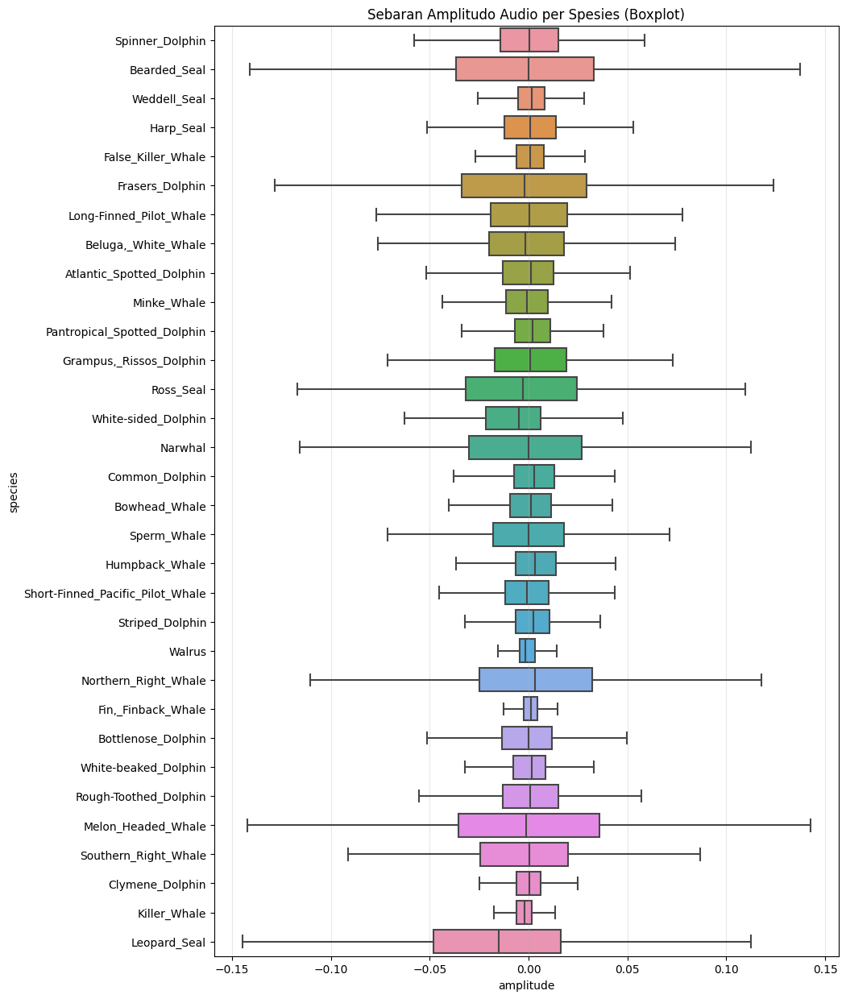

In [36]:
plt.figure(figsize=(10, 15)) # Perbesar tinggi agar semua label muat

sns.boxplot(
    data=df_eda, 
    x='amplitude', 
    y=TARGET,     # Spesies di sumbu Y agar label terbaca
    showfliers=False # Opsi: Hilangkan outlier ekstrem agar kotak utamanya terlihat jelas
)

plt.title('Sebaran Amplitudo Audio per Spesies (Boxplot)')
plt.grid(axis='x', alpha=0.3)
plt.show()

### 3.1.2 Energy

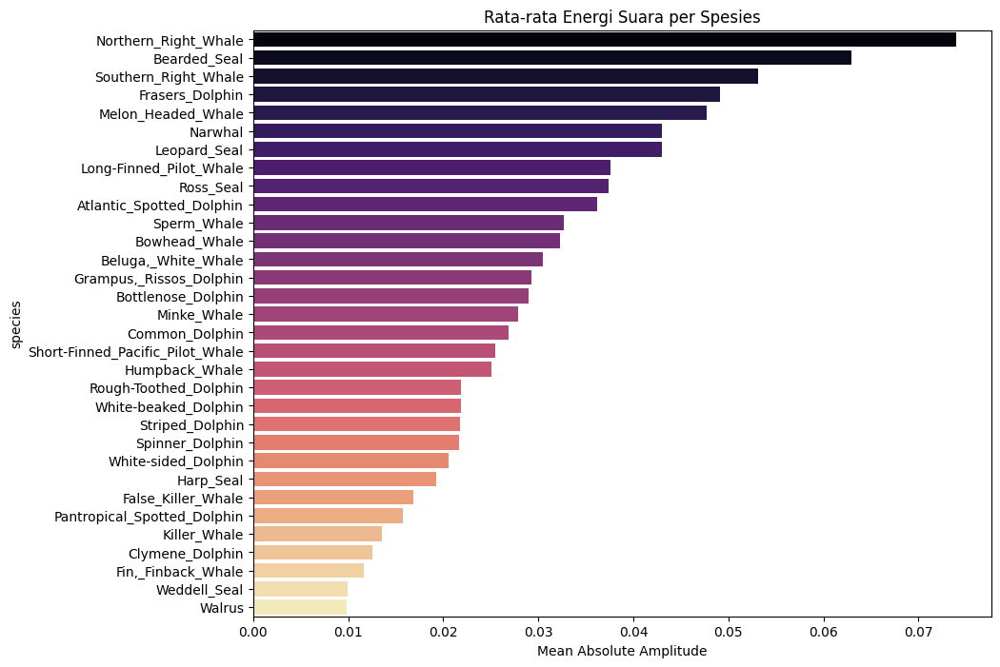

In [37]:
df_eda['abs_amplitude'] = df_eda['amplitude'].abs()

# Hitung rata-rata energi per spesies dan urutkan
energy_stats = df_eda.groupby(TARGET)['abs_amplitude'].mean().sort_values(ascending=False).reset_index()

plt.figure(figsize=(10, 8))
sns.barplot(data=energy_stats, x='abs_amplitude', y=TARGET, palette='magma')
plt.title('Rata-rata Energi Suara per Spesies')
plt.xlabel('Mean Absolute Amplitude')
plt.show()

### 3.1.3 Kurtosis Analysis

Top 5 Spesies dengan Suara Paling Impulsif (Klik/Detak):
                       species  kurtosis_value
0                       Walrus      108.997094
1  Pantropical_Spotted_Dolphin       38.856439
2                  Minke_Whale       34.500256
3         White-beaked_Dolphin       27.622420
4           Bottlenose_Dolphin       21.829438


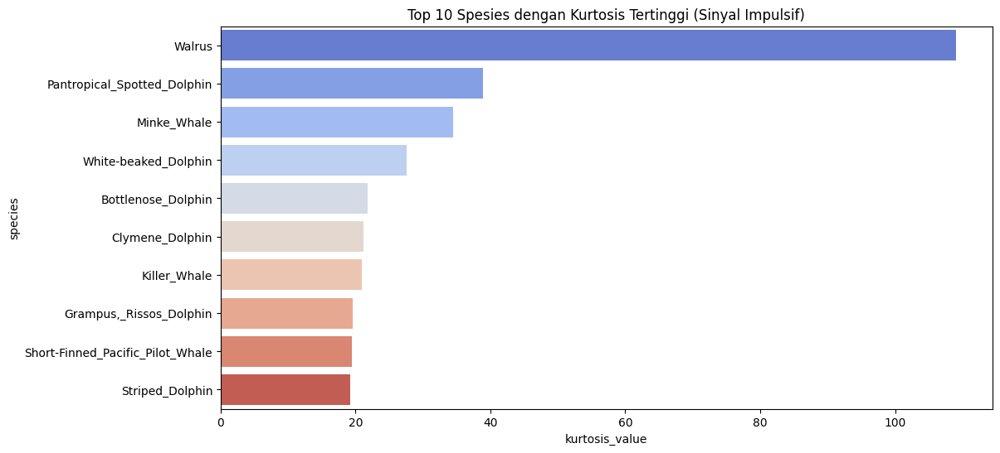

In [38]:
kurtosis_stats = df_eda.groupby(TARGET)['amplitude'].apply(kurtosis).sort_values(ascending=False).reset_index()
kurtosis_stats.columns = [TARGET, 'kurtosis_value']

print("Top 5 Spesies dengan Suara Paling Impulsif (Klik/Detak):")
print(kurtosis_stats.head())

plt.figure(figsize=(12, 6))
sns.barplot(data=kurtosis_stats.head(10), x='kurtosis_value', y=TARGET, palette='coolwarm')
plt.title('Top 10 Spesies dengan Kurtosis Tertinggi (Sinyal Impulsif)')
plt.show()

### 3.1.4 Silence Detection

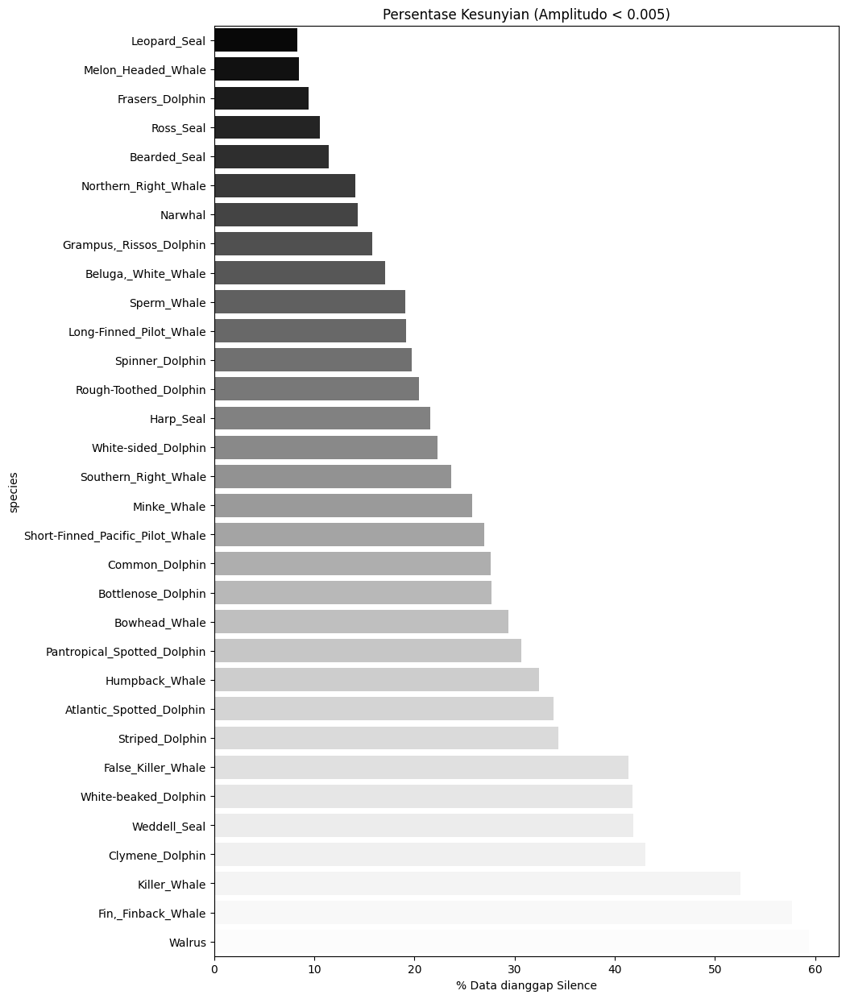

In [39]:
THRESHOLD = 0.005 
silence_stats = df_eda.groupby(TARGET)['amplitude'].apply(
    lambda x: (x.abs() < THRESHOLD).mean() * 100
).reset_index(name='silence_percentage')

plt.figure(figsize=(10, 15))
sns.barplot(data=silence_stats.sort_values('silence_percentage'), x='silence_percentage', y=TARGET, palette='Greys_r')
plt.title(f'Persentase Kesunyian (Amplitudo < {THRESHOLD})')
plt.xlabel('% Data dianggap Silence')
plt.show()

## 3.2 Physics Analysis

### 3.2.1 Spectogram

Membuat plot untuk 32 spesies...


/usr/local/lib/python3.11/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1448
  warnings.warn(


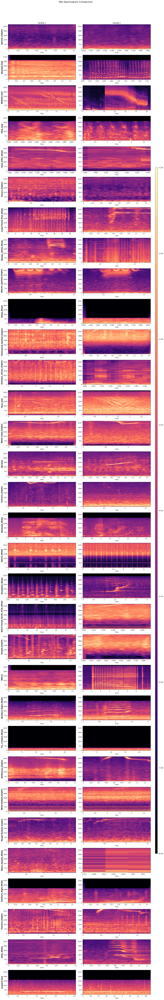

In [40]:
def plot_spectrograms(df, n_samples=2):
    unique_species = df['species'].unique()
    n_rows = len(unique_species)
    n_cols = n_samples
    fig_height = max(4, 3 * n_rows) 
    fig, axes = plt.subplots(
        nrows=n_rows, 
        ncols=n_cols, 
        figsize=(15, fig_height),
        squeeze=False, 
    )
    
    print(f"Membuat plot untuk {n_rows} spesies...")

    for i, species in enumerate(unique_species):
        subset = df[df['species'] == species]
        current_n_samples = min(len(subset), n_samples)
        subset = subset.sample(current_n_samples)
        
        for j, (idx, row) in enumerate(subset.iterrows()):
            ax = axes[i, j]
            y = np.array(row['y'])
            sr = row['sr']
            S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=sr/2)
            S_dB = librosa.power_to_db(S, ref=np.max)
            img = librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr, fmax=sr/2, ax=ax)
            if i == 0:
                ax.set_title(f"Sample {j+1}")
            if j == 0:
                ax.set_ylabel(species, fontsize=12, fontweight='bold')
            else:
                ax.set_ylabel('')
        for k in range(current_n_samples, n_cols):
            axes[i, k].axis('off')
            
    plt.tight_layout()

    cbar_ax = fig.add_axes([1.02, 0.15, 0.015, 0.7]) 
    fig.colorbar(img, cax=cbar_ax, format='%+2.0f dB')
    
    plt.suptitle("Mel-Spectrogram Comparison", fontsize=16, y=1.02)
    plt.show()
    
plot_spectrograms(df_train)

### 3.2.2 Power Spectral Density (PSD) - FFT

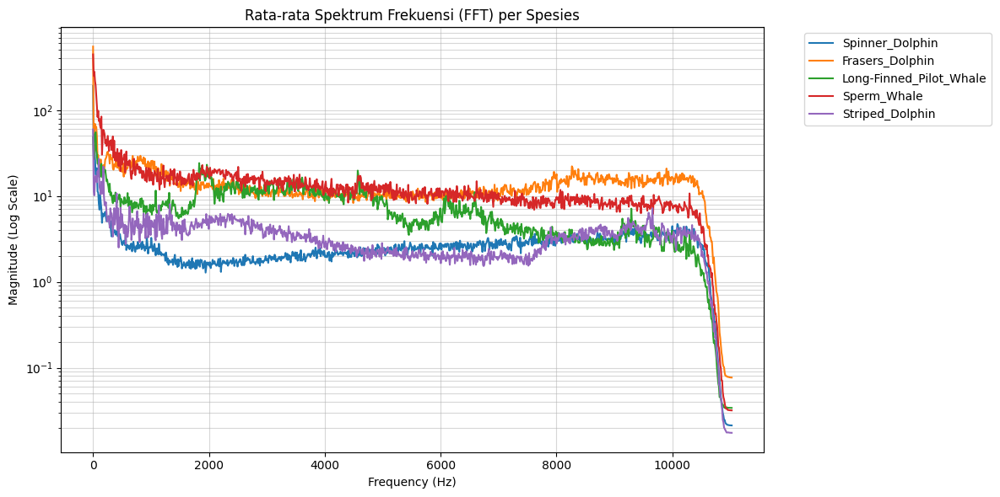

In [41]:
def plot_average_spectrum(df, label_col='species', n_samples=50):
    plt.figure(figsize=(12, 6))
    
    unique_species = df[label_col].unique()
    
    for species in unique_species:
        # Ambil sampel agar cepat
        subset = df[df[label_col] == species]
        if len(subset) > n_samples:
            subset = subset.sample(n_samples, random_state=SEED)
            
        magnitudes = []
        
        for _, row in subset.iterrows():
            y = np.array(row['y'])
            sr = row['sr']
            
            # Hitung FFT (Hanya bagian positif/real)
            yf = rfft(y)
            xf = rfftfreq(len(y), 1 / sr)
            
            # Normalisasi magnitude
            mag = np.abs(yf)
            target_x = np.linspace(0, sr/2, 1000)
            interp_mag = np.interp(target_x, xf, mag)
            magnitudes.append(interp_mag)
            
        # Hitung rata-rata spektrum per spesies
        avg_mag = np.mean(magnitudes, axis=0)
        
        # Plot (gunakan skala Log agar frekuensi rendah terlihat jelas)
        plt.semilogy(np.linspace(0, sr/2, 1000), avg_mag, label=species)

    plt.title('Rata-rata Spektrum Frekuensi (FFT) per Spesies')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude (Log Scale)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, which="both", ls="-", alpha=0.5)
    plt.tight_layout()
    plt.show()

# Filter top 5 spesies biar plot tidak ruwet
top_5 = df_train['species'].value_counts().head(5).index
plot_average_spectrum(df_train[df_train['species'].isin(top_5)])

### 3.2.3 Audio Correlation Heatmap (MFCC)

Processing 1357 samples with Mean + Std extraction...


/usr/local/lib/python3.11/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1184
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1448
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1460
  warnings.warn(


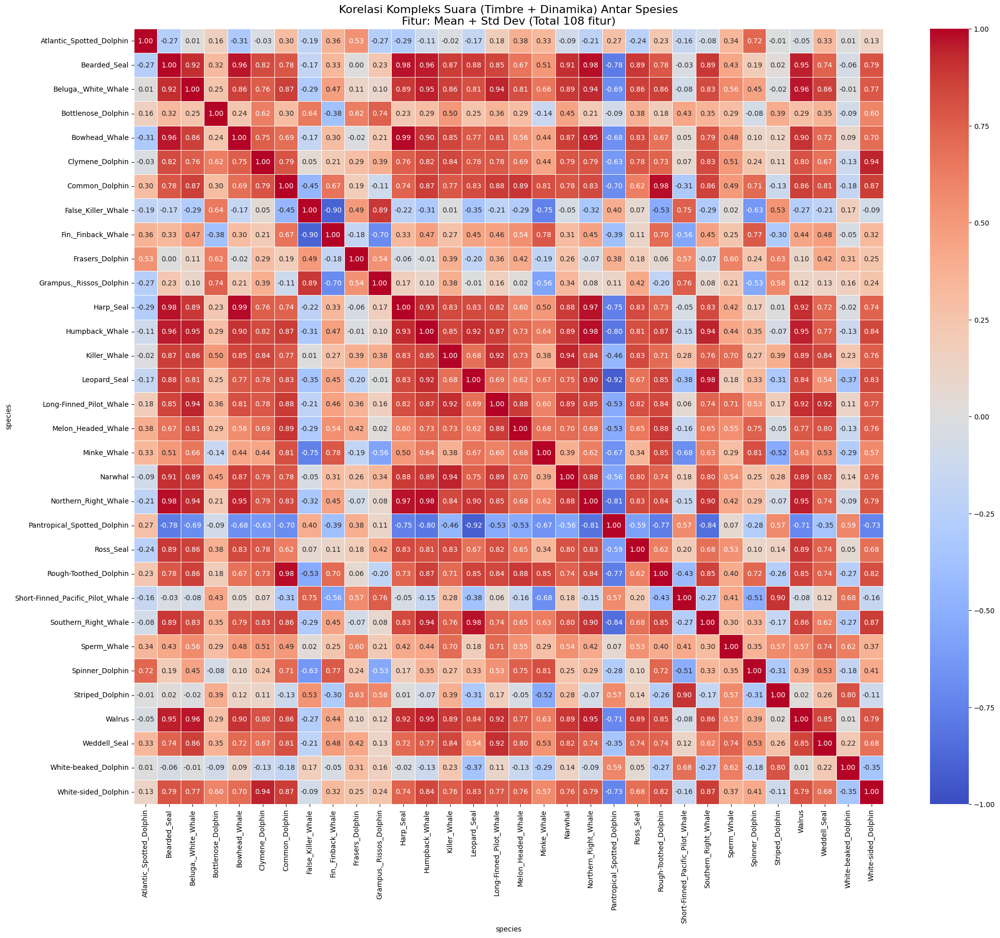

In [42]:
mfcc_list = []
species_list = []
N_MFCC = 55

n_samples = len(df_train)
sample_df = df_train.sample(frac=1, random_state=SEED).reset_index(drop=True) 

print(f"Processing {len(sample_df)} samples with Mean + Std extraction...")

for idx, row in sample_df.iterrows():
    y = np.array(row['y'])
    sr = row['sr']
    
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=N_MFCC)

    mfcc_mean = np.mean(mfcc, axis=1)
    mfcc_std = np.std(mfcc, axis=1)
    combined_features = np.concatenate((mfcc_mean[1:], mfcc_std[1:]))
    
    mfcc_list.append(combined_features)
    species_list.append(row['species'])

n_feats = N_MFCC - 1 # 54 fitur
cols_mean = [f'mfcc_mean_{i+1}' for i in range(n_feats)]
cols_std  = [f'mfcc_std_{i+1}' for i in range(n_feats)]
all_cols = cols_mean + cols_std

df_mfcc = pd.DataFrame(mfcc_list, columns=all_cols)
df_mfcc['species'] = species_list

species_profiles = df_mfcc.groupby('species').mean().T 

# 6. PLOTTING
plt.figure(figsize=(24, 20))
sns.heatmap(
    species_profiles.corr(), 
    annot=True, 
    cmap='coolwarm', 
    fmt=".2f", 
    linewidths=.5, 
    vmin=-1, 
    vmax=1
)
plt.title(f'Korelasi Kompleks Suara (Timbre + Dinamika) Antar Spesies\nFitur: Mean + Std Dev (Total {len(all_cols)} fitur)', fontsize=16)
plt.show()

## 3.2.4 Waveform

Plotting 32 species...


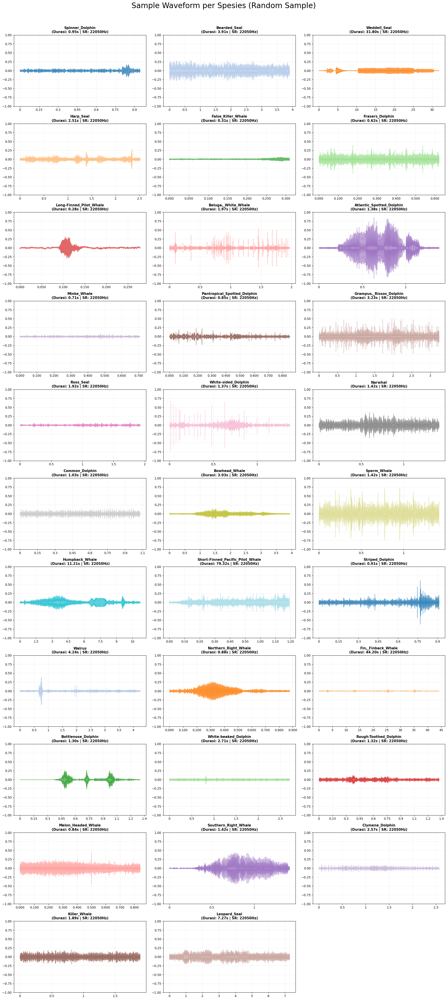

In [47]:
import math

def plot_all_species_waveforms(df, audio_col='y', sr_col='sr', label_col='species'):
    unique_species = df[label_col].unique()
    n_species = len(unique_species)
    n_cols = 3 
    n_rows = math.ceil(n_species / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
    fig.suptitle('Sample Waveform per Spesies (Random Sample)', fontsize=24, y=1.01)
    
    axes = axes.flatten()
    
    print(f"Plotting {n_species} species...")
    
    for i, species in enumerate(unique_species):
        ax = axes[i]
        sample_row = df[df[label_col] == species].sample(1, random_state=SEED).iloc[0]
        
        y = np.array(sample_row[audio_col])
        sr = sample_row[sr_col]
        duration = len(y) / sr
        color = plt.cm.tab20(i % 20) 
        librosa.display.waveshow(y, sr=sr, ax=ax, color=color, alpha=0.7)
        
        # Kosmetik Plot
        ax.set_title(f"{species}\n(Durasi: {duration:.2f}s | SR: {sr}Hz)", fontsize=11, fontweight='bold')
        ax.set_ylim(-1, 1)
        ax.set_xlabel("") 
        ax.grid(True, alpha=0.2)
        
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
        
    plt.tight_layout()
    plt.show()

plot_all_species_waveforms(df_train, audio_col='y', sr_col='sr', label_col='species')

## 3.3 Data Analysis

### 3.3.1 KDE of Audio Length in Time

In [43]:
df_train['duration_sec'] = df_train['length'] / df_train['sr']

print(df_train.groupby('species')['duration_sec'].describe())

                                  count       mean         std        min  \
species                                                                     
Atlantic_Spotted_Dolphin           46.0   2.889695    8.419804   0.864580   
Bearded_Seal                       30.0  11.193277   26.911925   0.750023   
Beluga,_White_Whale                40.0   2.710396    1.701563   0.640862   
Bottlenose_Dolphin                 19.0   1.254190    0.222319   0.768617   
Bowhead_Whale                      48.0   7.546766   19.980590   1.824036   
Clymene_Dolphin                    50.0   2.043453    0.625523   0.709025   
Common_Dolphin                     42.0   7.768136   16.659345   0.405079   
False_Killer_Whale                 47.0   1.224921    1.022171   0.309388   
Fin,_Finback_Whale                 40.0  48.440967   24.394761   5.938367   
Frasers_Dolphin                    69.0   5.692069    9.033245   0.340544   
Grampus,_Rissos_Dolphin            54.0   2.839783    6.704603   0.248163   

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated a

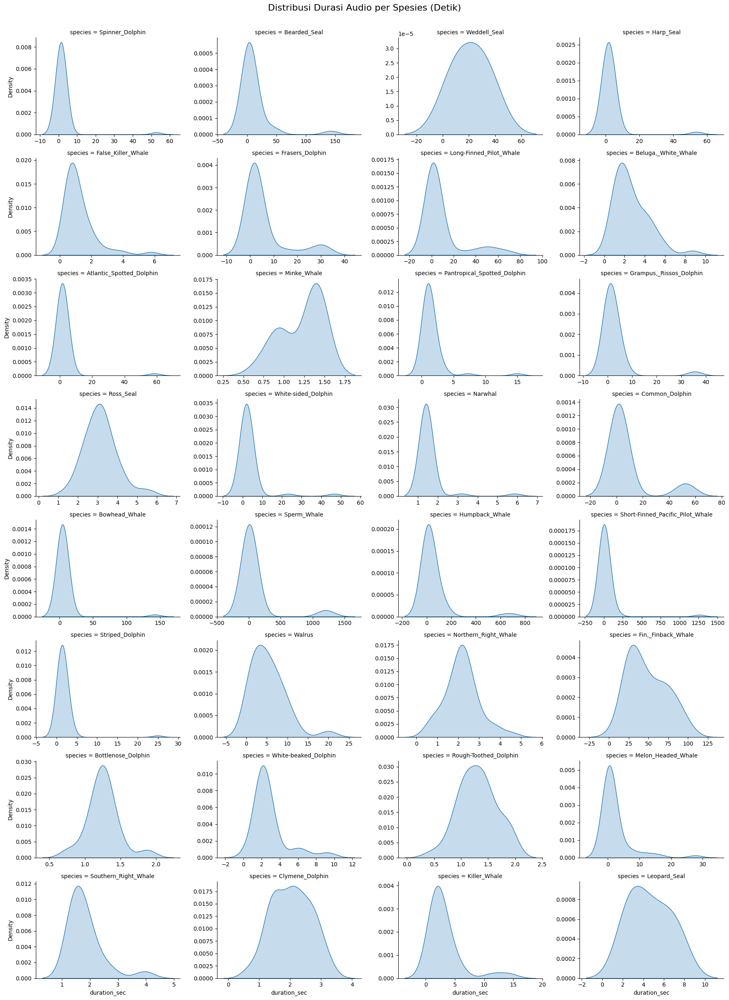

In [44]:
g = sns.displot(
    data=df_train, 
    x='duration_sec', 
    col='species', 
    col_wrap=4, 
    kind='kde', 
    fill=True, 
    height=3, 
    aspect=1.5,
    facet_kws={'sharex': False, 'sharey': False} 
)

g.fig.suptitle('Distribusi Durasi Audio per Spesies (Detik)', y=1.02, fontsize=16)
plt.show()